<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

Data: https://drive.google.com/uc?id=1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36

In [128]:
import json
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import h5py
from collections import Counter
import sys
import torch, torch.nn as nn
import torch.nn.functional as F
from random import choice
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
import warnings
from skimage.transform import resize
from tempfile import mktemp
from os import remove

%matplotlib inline

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://drive.google.com/file/d/1NLtoLqZzeES_flgs9kmmeZD_tsCTenH1/view?usp=sharing).

Please either download data from [here](https://drive.google.com/file/d/1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36/view?usp=drive_link) or generate it manually using the above script.

In [15]:
f = h5py.File('./attention/img_codes.hdf5', 'r')
img_codes = f['data']

In [16]:
captions = json.load(open('./attention/captions_tokenized.json'))

In [17]:
print(f"Each image code is a 512x9x9-unit tensor [ shape: {len(img_codes)} x {img_codes[0].shape} ]")
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [18]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i]
        captions[img_i][caption_i] = ["#START#"] + sentence.split(' ') + ["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [27]:
# Build a Vocabulary
word_counts = Counter()
for blok_caption in captions:
    for caption in blok_caption:
        for word in caption:
            word_counts[word] += 1

In [29]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [49]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len, sequences))
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i, seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix

    return matrix

In [50]:
#try it out on several descriptions of a random image
as_matrix(captions[1327])

array([[   1,   14,   90,  303, 1316,   62,   43,   84,   18,   14,   80,
          13,    2,    3,    3,    3,    3],
       [   1,   14,   80,  508,    5,  159,    8,   24,   62,   79,    2,
           3,    3,    3,    3,    3,    3],
       [   1,   14,  246,    5,  241,  159, 3630,   18,   14, 1152, 2224,
          62,   14,  447,   80,   13,    2],
       [   1,   88,  159,   24,  543,   14,  482,   62,   14,   80,   13,
           2,    3,    3,    3,    3,    3],
       [   1,  122,  159,  543,   14,  482,    5,    0,  598,   13,    2,
           3,    3,    3,    3,    3,    3]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part.

We'll unbox the inception net later to save memory, for now just pretend that it's available.

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [51]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        return torch.bmm(queries, keys.transpose(1, 2)) / np.sqrt(keys.shape[2])

Test for ScaledDotProductScore

In [52]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [54]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        weights = F.softmax(scores, dim=2)
        self.attention_map = weights.detach()
        result = torch.bmm(weights, values)
        return result

Tests for Attention layer

In [55]:
attn = Attention(ScaledDotProductScore())

In [56]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [57]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [58]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [93]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()

        # a layer that converts conv features to
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)

        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)

        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())

        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)

        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(cnn_channels + emb_size, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Linear(lstm_units + cnn_channels + emb_size, n_tokens)

    def forward(self, image_features, captions_ix):
        """
        Apply the network in training mode.
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))

        image_features = image_features.transpose(1, 2)

        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)

        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        
        h = initial_hid
        c = initial_cell
        keys = self.cnn_to_attn_key(image_features)
        
        reccurent_out = []
        attention_map = []
        
        for i in range(captions_emb.shape[1]):
            context = self.attention(h.unsqueeze(dim=1), keys, image_features)
            attention_map.append(self.attention.attention_map.squeeze(dim=1))
            h, c = self.lstm(torch.cat((captions_emb[:, i], context.squeeze(dim=1)), dim=-1), (h, c))
            reccurent_out.append(torch.cat((h, context.squeeze(dim=1), captions_emb[:, i]), dim=-1))

        attention_map = torch.stack(attention_map, dim=1)

        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(torch.stack(reccurent_out, dim=1))

        # return logits and attention maps from (2.4)
        return logits, attention_map

In [94]:
network = CaptionNet(n_tokens)

In [95]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [96]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus
              attention regularizer. Scalar float tensor
    """

    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()

    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()

    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)


    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.

    loss = nn.CrossEntropyLoss(ignore_index=pad_ix)(logits_for_next.transpose(1, 2), captions_ix_next)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()

    return loss + regularizer

In [97]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [98]:
optimizer = torch.optim.Adam(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [99]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx

    def __len__(self):
        return len(self.idx)

    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [100]:
# works in numpy 1.23.5
captions = np.array(captions, dtype=object)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [102]:
last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):

    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0

    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)

    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]

    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))

    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)

    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [103]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0765, 0.3784, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9596, 1.1182, 0.9482],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)


* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again

* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [105]:
batch_size = 64  # adjust me
n_epochs = 64    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [106]:
for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()

    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))

            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()

            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch

    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches

    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|███████████████████████████████████████████| 64/64 [01:01<00:00,  1.04it/s]



Epoch: 0, train loss: 6.98462338000536, val loss: 5.406935155391693


100%|███████████████████████████████████████████| 64/64 [01:12<00:00,  1.13s/it]



Epoch: 1, train loss: 4.980420239269733, val loss: 4.642858386039734


100%|███████████████████████████████████████████| 64/64 [00:54<00:00,  1.18it/s]



Epoch: 2, train loss: 4.566733367741108, val loss: 4.495551347732544


100%|███████████████████████████████████████████| 64/64 [00:53<00:00,  1.19it/s]



Epoch: 3, train loss: 4.38085400313139, val loss: 4.3772589564323425


100%|███████████████████████████████████████████| 64/64 [00:53<00:00,  1.20it/s]



Epoch: 4, train loss: 4.220622707158327, val loss: 4.233893811702728


100%|███████████████████████████████████████████| 64/64 [00:55<00:00,  1.16it/s]



Epoch: 5, train loss: 4.1490171775221825, val loss: 4.1448792815208435


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.11it/s]



Epoch: 6, train loss: 4.026343185454607, val loss: 4.034706920385361


100%|███████████████████████████████████████████| 64/64 [00:50<00:00,  1.27it/s]



Epoch: 7, train loss: 3.9900290854275227, val loss: 3.920308083295822


100%|███████████████████████████████████████████| 64/64 [00:56<00:00,  1.13it/s]



Epoch: 8, train loss: 3.955630235373974, val loss: 3.95010444521904


100%|███████████████████████████████████████████| 64/64 [01:01<00:00,  1.03it/s]



Epoch: 9, train loss: 3.8910002931952477, val loss: 3.8433244824409485


100%|███████████████████████████████████████████| 64/64 [01:04<00:00,  1.01s/it]



Epoch: 10, train loss: 3.849340543150902, val loss: 3.818810820579529


100%|███████████████████████████████████████████| 64/64 [00:58<00:00,  1.10it/s]



Epoch: 11, train loss: 3.8068868331611156, val loss: 3.750428229570389


100%|███████████████████████████████████████████| 64/64 [00:51<00:00,  1.23it/s]



Epoch: 12, train loss: 3.767521407455206, val loss: 3.7653705179691315


100%|███████████████████████████████████████████| 64/64 [06:06<00:00,  5.72s/it]



Epoch: 13, train loss: 3.723152209073305, val loss: 3.814286708831787


100%|███████████████████████████████████████████| 64/64 [00:58<00:00,  1.09it/s]



Epoch: 14, train loss: 3.730929918587208, val loss: 3.666481465101242


100%|███████████████████████████████████████████| 64/64 [00:55<00:00,  1.15it/s]



Epoch: 15, train loss: 3.694010689854622, val loss: 3.716799557209015


100%|███████████████████████████████████████████| 64/64 [01:00<00:00,  1.06it/s]



Epoch: 16, train loss: 3.676271490752697, val loss: 3.626415729522705


100%|███████████████████████████████████████████| 64/64 [00:55<00:00,  1.15it/s]



Epoch: 17, train loss: 3.642467398196459, val loss: 3.628244310617447


100%|███████████████████████████████████████████| 64/64 [01:00<00:00,  1.05it/s]



Epoch: 18, train loss: 3.6308057568967342, val loss: 3.617768734693527


100%|███████████████████████████████████████████| 64/64 [01:06<00:00,  1.04s/it]



Epoch: 19, train loss: 3.6280615888535976, val loss: 3.5885904133319855


100%|███████████████████████████████████████████| 64/64 [01:03<00:00,  1.01it/s]



Epoch: 20, train loss: 3.6104351989924908, val loss: 3.58993262052536


100%|███████████████████████████████████████████| 64/64 [01:02<00:00,  1.03it/s]



Epoch: 21, train loss: 3.5705852173268795, val loss: 3.4995899498462677


100%|███████████████████████████████████████████| 64/64 [00:52<00:00,  1.21it/s]



Epoch: 22, train loss: 3.583233032375574, val loss: 3.537574529647827


100%|███████████████████████████████████████████| 64/64 [00:56<00:00,  1.13it/s]



Epoch: 23, train loss: 3.547029633074999, val loss: 3.5723277628421783


100%|███████████████████████████████████████████| 64/64 [01:02<00:00,  1.02it/s]



Epoch: 24, train loss: 3.5568986907601357, val loss: 3.5634979009628296


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.12it/s]



Epoch: 25, train loss: 3.529410745948553, val loss: 3.549647808074951


100%|███████████████████████████████████████████| 64/64 [00:58<00:00,  1.09it/s]



Epoch: 26, train loss: 3.4903760738670826, val loss: 3.515763372182846


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.12it/s]



Epoch: 27, train loss: 3.4595772698521614, val loss: 3.546927332878113


100%|███████████████████████████████████████████| 64/64 [00:54<00:00,  1.17it/s]



Epoch: 28, train loss: 3.446613982319832, val loss: 3.447589635848999


100%|███████████████████████████████████████████| 64/64 [01:41<00:00,  1.59s/it]



Epoch: 29, train loss: 3.487588759511709, val loss: 3.5054988861083984


100%|███████████████████████████████████████████| 64/64 [00:59<00:00,  1.07it/s]



Epoch: 30, train loss: 3.43489695712924, val loss: 3.470487654209137


100%|███████████████████████████████████████████| 64/64 [01:19<00:00,  1.24s/it]



Epoch: 31, train loss: 3.4012201614677906, val loss: 3.481760174036026


100%|███████████████████████████████████████████| 64/64 [04:31<00:00,  4.25s/it]



Epoch: 32, train loss: 3.4102819599211216, val loss: 3.4952017962932587


100%|███████████████████████████████████████████| 64/64 [02:45<00:00,  2.59s/it]



Epoch: 33, train loss: 3.42335806787014, val loss: 3.3721475899219513


100%|███████████████████████████████████████████| 64/64 [01:32<00:00,  1.44s/it]



Epoch: 34, train loss: 3.412621770054102, val loss: 3.523777514696121


100%|███████████████████████████████████████████| 64/64 [01:17<00:00,  1.21s/it]



Epoch: 35, train loss: 3.3984691351652145, val loss: 3.449788063764572


100%|███████████████████████████████████████████| 64/64 [01:13<00:00,  1.15s/it]



Epoch: 36, train loss: 3.372240737080574, val loss: 3.483775645494461


100%|███████████████████████████████████████████| 64/64 [00:58<00:00,  1.09it/s]



Epoch: 37, train loss: 3.4154180325567722, val loss: 3.3938640654087067


100%|███████████████████████████████████████████| 64/64 [01:04<00:00,  1.01s/it]



Epoch: 38, train loss: 3.3730248920619488, val loss: 3.5047059655189514


100%|███████████████████████████████████████████| 64/64 [00:59<00:00,  1.08it/s]



Epoch: 39, train loss: 3.3747911117970943, val loss: 3.382909059524536


100%|███████████████████████████████████████████| 64/64 [01:02<00:00,  1.02it/s]



Epoch: 40, train loss: 3.3652460910379887, val loss: 3.353510707616806


100%|███████████████████████████████████████████| 64/64 [01:04<00:00,  1.02s/it]



Epoch: 41, train loss: 3.374245058745146, val loss: 3.4813208878040314


100%|███████████████████████████████████████████| 64/64 [01:01<00:00,  1.05it/s]



Epoch: 42, train loss: 3.3767837956547737, val loss: 3.380316197872162


100%|███████████████████████████████████████████| 64/64 [01:02<00:00,  1.03it/s]



Epoch: 43, train loss: 3.3484306260943413, val loss: 3.4320223331451416


100%|███████████████████████████████████████████| 64/64 [00:58<00:00,  1.09it/s]



Epoch: 44, train loss: 3.3365354500710964, val loss: 3.424991399049759


100%|███████████████████████████████████████████| 64/64 [01:01<00:00,  1.05it/s]



Epoch: 45, train loss: 3.3570386469364166, val loss: 3.3869046568870544


100%|███████████████████████████████████████████| 64/64 [01:00<00:00,  1.06it/s]



Epoch: 46, train loss: 3.320115491747856, val loss: 3.37389475107193


100%|███████████████████████████████████████████| 64/64 [01:07<00:00,  1.06s/it]



Epoch: 47, train loss: 3.3218480721116066, val loss: 3.4282442331314087


100%|███████████████████████████████████████████| 64/64 [01:00<00:00,  1.06it/s]



Epoch: 48, train loss: 3.3498263210058212, val loss: 3.3746933937072754


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.10it/s]



Epoch: 49, train loss: 3.3185837157070637, val loss: 3.410351485013962


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.10it/s]



Epoch: 50, train loss: 3.325194962322712, val loss: 3.427342504262924


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.11it/s]



Epoch: 51, train loss: 3.2933215498924255, val loss: 3.3050040304660797


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.11it/s]



Epoch: 52, train loss: 3.2748370692133904, val loss: 3.438727021217346


100%|███████████████████████████████████████████| 64/64 [00:59<00:00,  1.08it/s]



Epoch: 53, train loss: 3.2633867226541042, val loss: 3.298121690750122


100%|███████████████████████████████████████████| 64/64 [01:02<00:00,  1.03it/s]



Epoch: 54, train loss: 3.262357469648123, val loss: 3.3494755923748016


100%|███████████████████████████████████████████| 64/64 [01:00<00:00,  1.06it/s]



Epoch: 55, train loss: 3.2774784304201603, val loss: 3.3701921701431274


100%|███████████████████████████████████████████| 64/64 [00:55<00:00,  1.15it/s]



Epoch: 56, train loss: 3.2631438188254833, val loss: 3.255379468202591


100%|███████████████████████████████████████████| 64/64 [00:57<00:00,  1.12it/s]



Epoch: 57, train loss: 3.2525700256228447, val loss: 3.3676686882972717


100%|███████████████████████████████████████████| 64/64 [00:51<00:00,  1.24it/s]



Epoch: 58, train loss: 3.2193010598421097, val loss: 3.3379677832126617


100%|███████████████████████████████████████████| 64/64 [00:56<00:00,  1.14it/s]



Epoch: 59, train loss: 3.2670293152332306, val loss: 3.3146848380565643


100%|███████████████████████████████████████████| 64/64 [00:56<00:00,  1.14it/s]



Epoch: 60, train loss: 3.2858244851231575, val loss: 3.3173541724681854


100%|███████████████████████████████████████████| 64/64 [00:56<00:00,  1.14it/s]



Epoch: 61, train loss: 3.257592737674713, val loss: 3.3768147826194763


100%|███████████████████████████████████████████| 64/64 [00:54<00:00,  1.17it/s]



Epoch: 62, train loss: 3.2375283390283585, val loss: 3.3448393642902374


100%|███████████████████████████████████████████| 64/64 [00:52<00:00,  1.21it/s]



Epoch: 63, train loss: 3.2276102751493454, val loss: 3.2532081604003906
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [111]:
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """

    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits

features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /Users/bogdanovaleksandr/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [122]:
def generate_caption(image, caption_prefix = ("#START#",),
                     t=1, sample=True, max_len=100):

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3

    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)

    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)

    attention_maps = []

    for _ in range(max_len):

        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())

        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs)
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [123]:
# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))

def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

a man in a blue shirt and a white shirt and a white shirt .
a man in a white shirt and a white shirt and a white shirt .
a man is holding a plate of food and a fork .
a man in a shirt and tie sitting on a table .
a man in a white shirt and tie sitting on a table .
a man in a blue shirt and a white shirt and a white shirt
a man with a shirt and a tie .
a man in a blue shirt and a white shirt and a knife .
a man holding a plate of food and a spoon .
a man in a white shirt and a tie with a spoon .


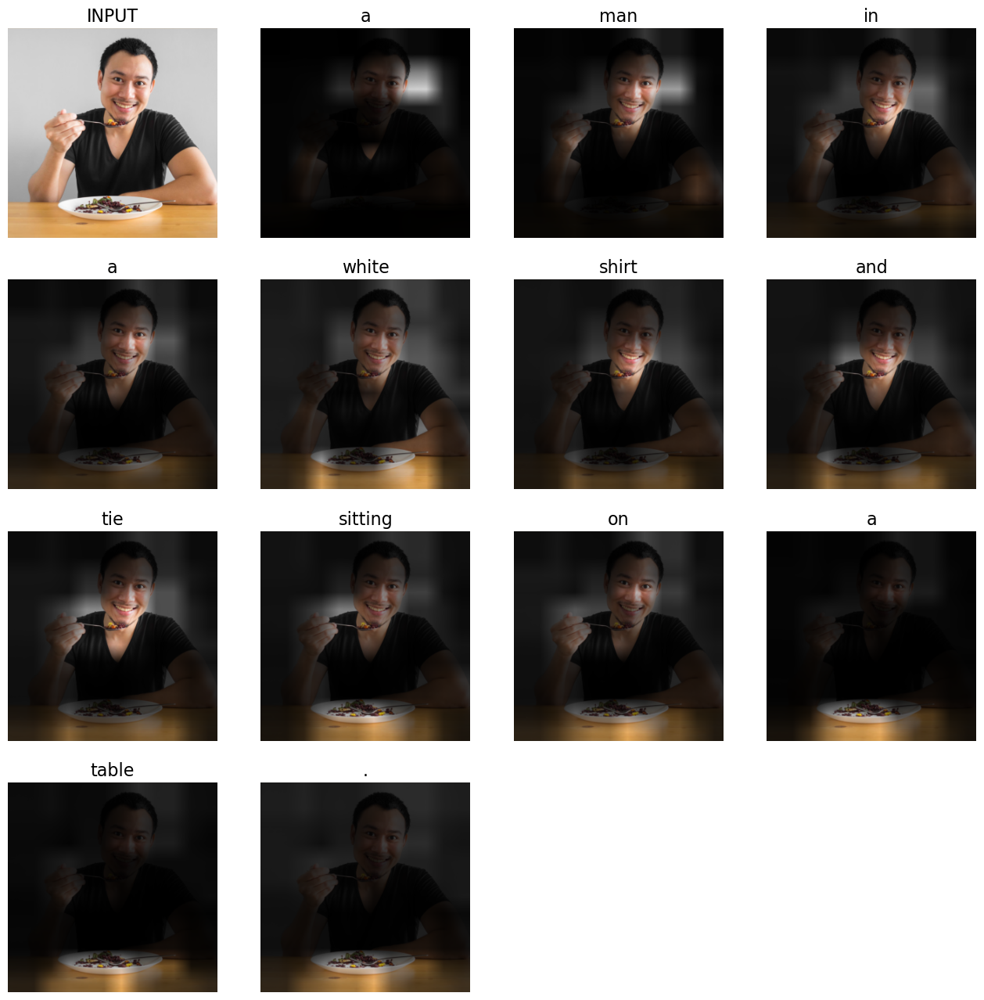

In [141]:
process_image(obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg"))

a cat laying on top of a chair .
a cat laying on top of a black cat .
a cat laying on a couch with a cat on its back .
a cat laying on top of a couch .
a cat laying on a couch with a cat on its back .
a cat laying on top of a chair .
a cat that is sitting on a chair .
a cat laying on a couch with a cat on its back .
a cat laying on top of a chair .
a cat laying on a couch with a cat on its back .


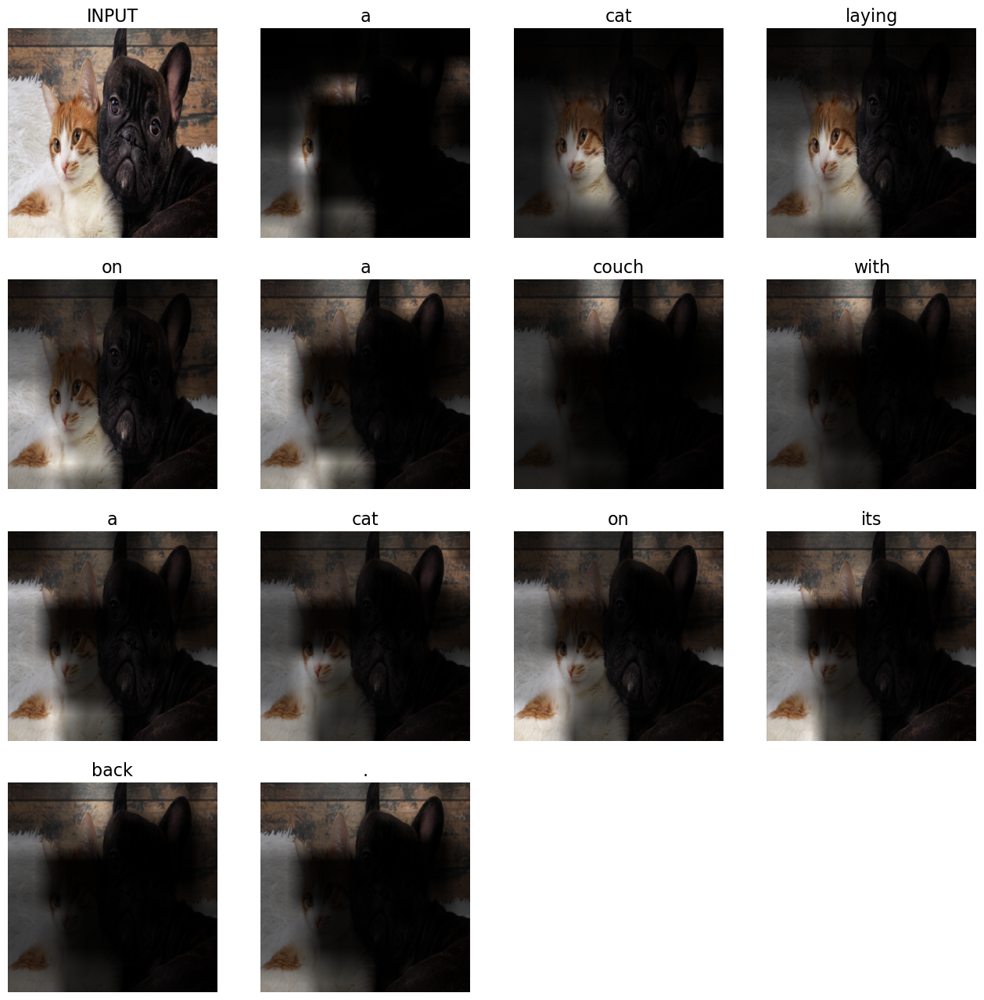

In [143]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard on top of a skateboard .
a man is doing a trick on a skateboard .
a man in a red shirt doing a trick on a skateboard .
a man riding a skateboard on a skateboard .
a man riding a skateboard on a skateboard .
a man on a skateboard does a trick on a skateboard .
a man in a blue shirt doing a trick on a skateboard .
a man riding a skateboard on top of a skateboard .
a man and a skateboard on a skateboard .
a man in a skate board riding a skateboard .


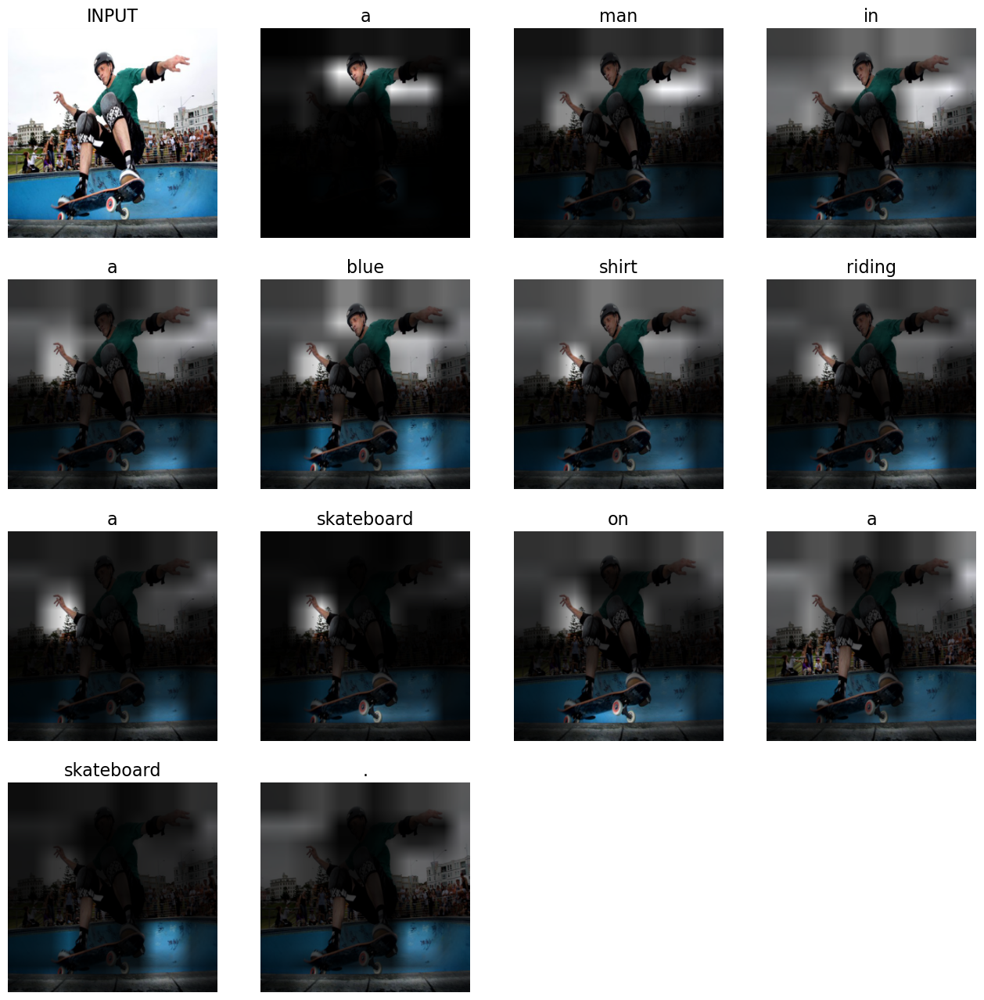

In [149]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a dog riding a horse in the snow .
a dog running through the snow on a snow covered mountain .
a dog riding a horse on a beach .
a dog running through the snow on a snow covered mountain .
a dog is standing in the snow with a frisbee .
a dog running through a snow covered mountain .
a dog running through a snow covered field .
a dog running through a snow covered mountain .
a dog running through the snow covered in snow .
a dog is riding a frisbee on a snow covered slope .


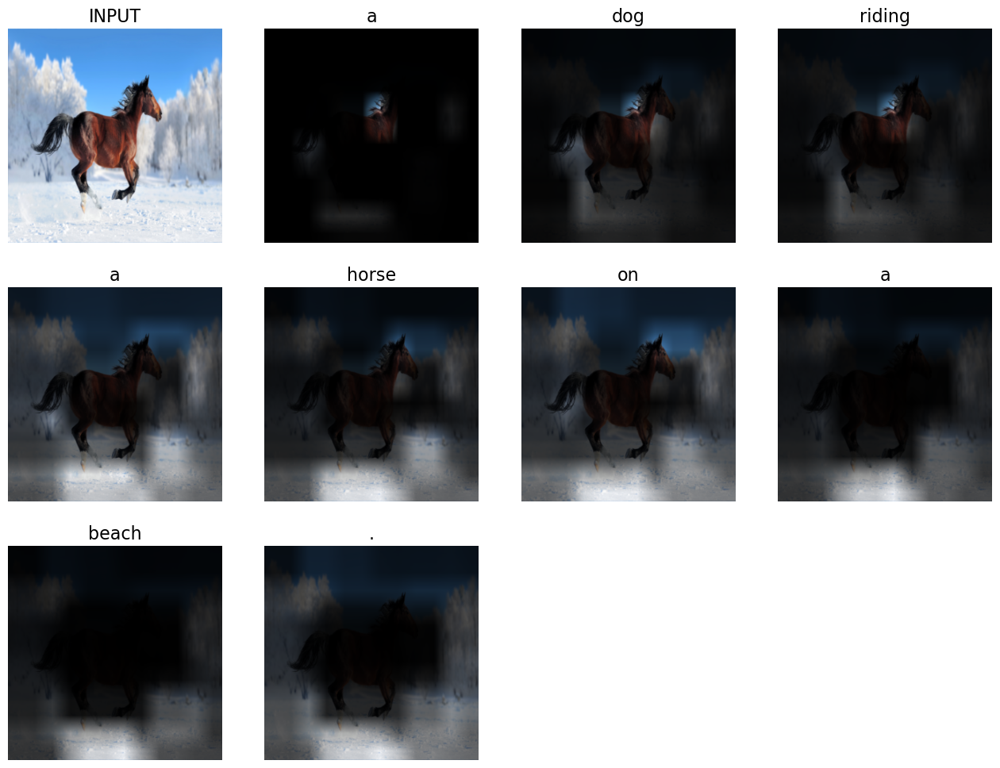

In [153]:
process_image(obtain_image(url="https://s1.1zoom.me/b5050/927/Horses_Snow_Run_485367_3840x2160.jpg"))

a man standing in a park bench near a brick building .
a man standing next to a bench in a park .
a woman standing on a sidewalk with a dog on the ground .
a man standing in a park with a dog on his back .
a man in a blue shirt and a black dog on a bench .
a man in a black shirt is standing on a sidewalk .
a man standing on a sidewalk with a dog and a dog .
a man in a red shirt is walking on a sidewalk .
a man standing on a bench with a dog on the ground .
a man in a blue shirt is standing on a sidewalk .


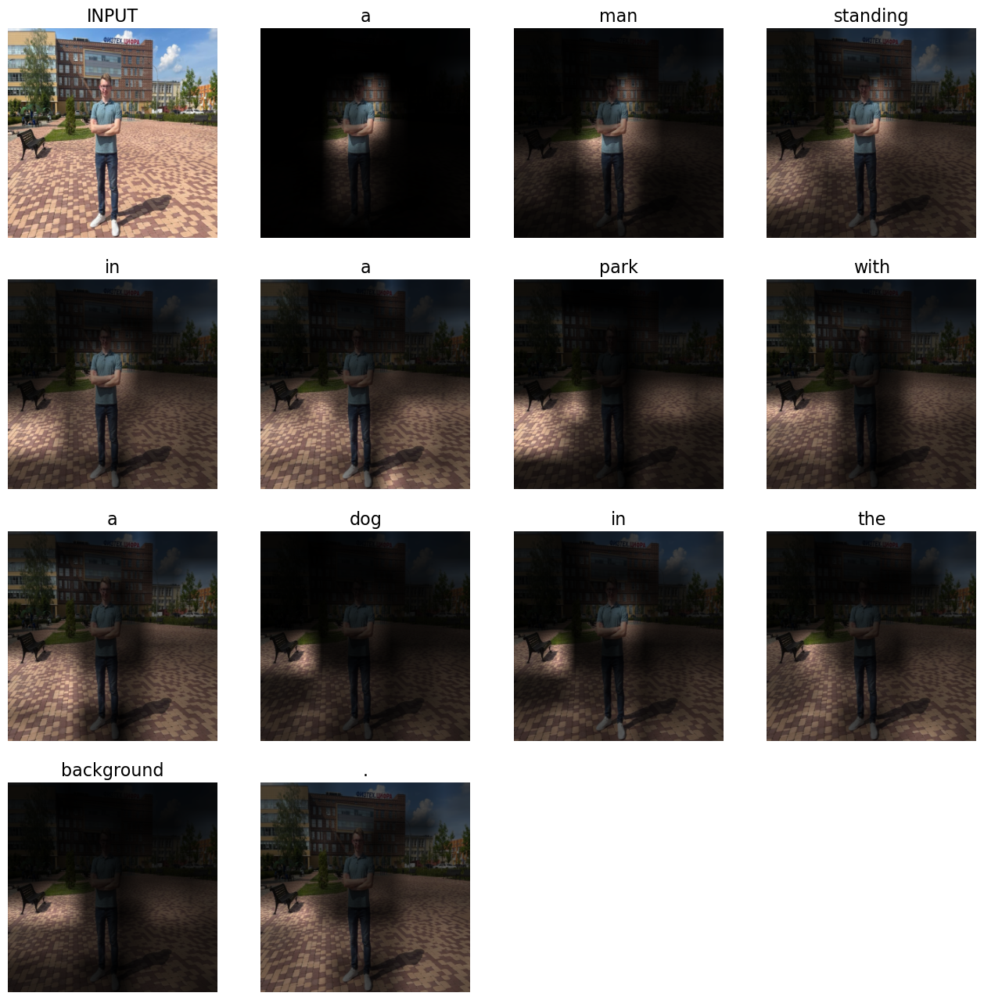

In [159]:
process_image(obtain_image(filename="figures/9KU6-dPwLaQ.jpg"))

a person on a bike with a helmet and a bike .
a man on a bike with a helmet and a bike .
a man on a bike with a red frisbee .
a man on a bike with a helmet and a bike .
a man on a bike with a frisbee on the side .
a man on a bike with a helmet and a bicycle .
a man with a helmet on a bike on a bike .
a man riding a bike on a dirt bike .
a man on a bike with a helmet and a bike .
a man riding a bike on a bike with a bike .


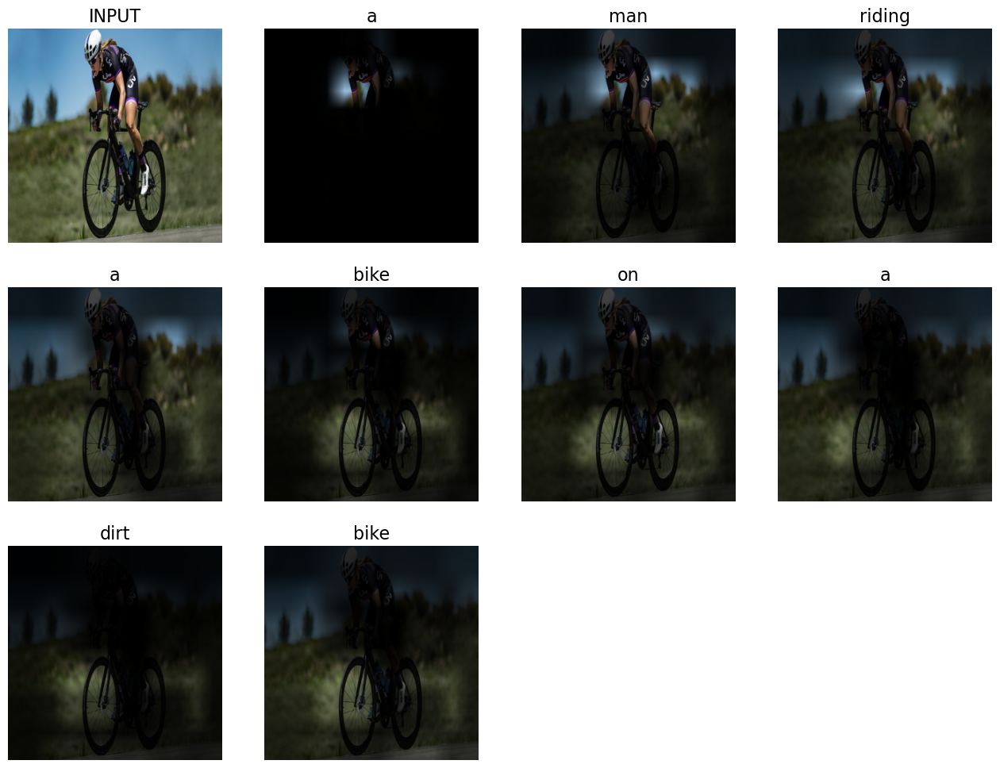

In [160]:
process_image(obtain_image(url="https://kladzdor.ru/upload/medialibrary/5ca/bystro-edet-na-velosipede.jpg"))

a man in a blue shirt and a soccer ball on a field .
a man in a white shirt and a white shirt playing a game .
a man in a white shirt and a soccer ball
a man in a white shirt and a soccer ball
a man in a white shirt and a soccer ball
a man in a white shirt and a soccer ball
a man is standing on a field with a soccer ball .
a man in a white shirt and a soccer ball
a man in a white shirt and a white shirt playing frisbee .
a man in a white shirt and a soccer ball


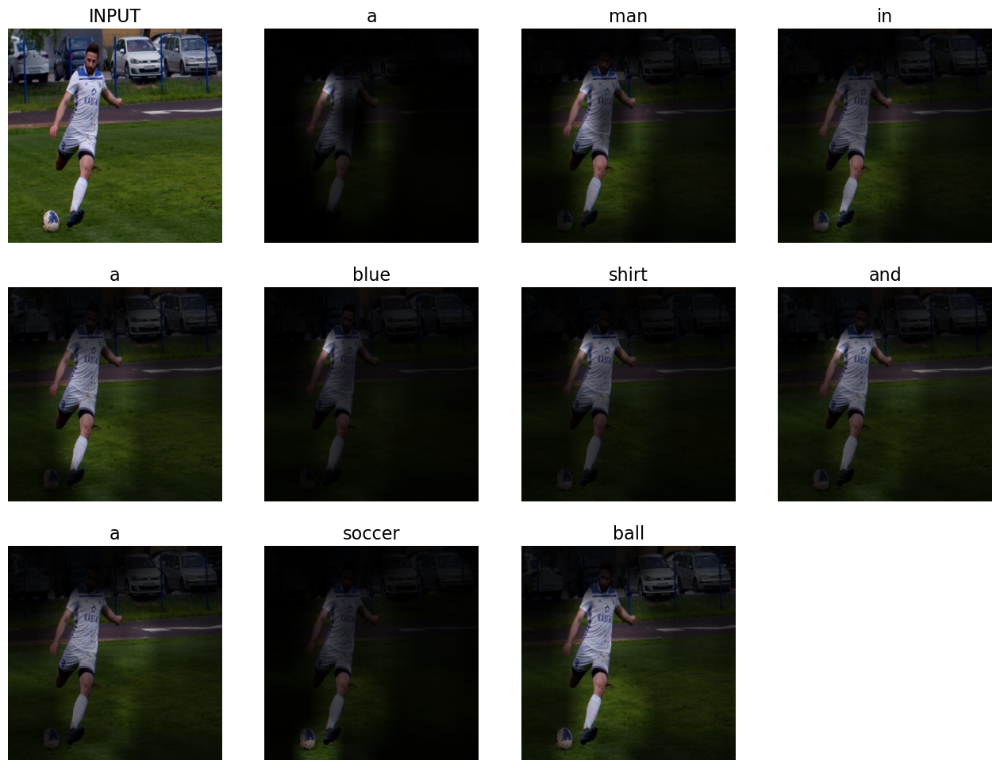

In [162]:
process_image(obtain_image(filename="figures/iDehwQ7aUsg.jpg"))

a man and a dog on a leash on a leash .
a man standing on a sidewalk with a dog on a leash .
a man and a dog standing on a sidewalk .
a man and a dog standing on a sidewalk
a woman standing on a sidewalk with a dog on a leash .
a man in a white shirt and a dog sitting on a leash .
a woman standing on a sidewalk with a dog on the side of it .
a man and a dog are standing on a sidewalk .
a man standing on a sidewalk with a dog on the side of a street .
a man and a dog standing on a sidewalk .


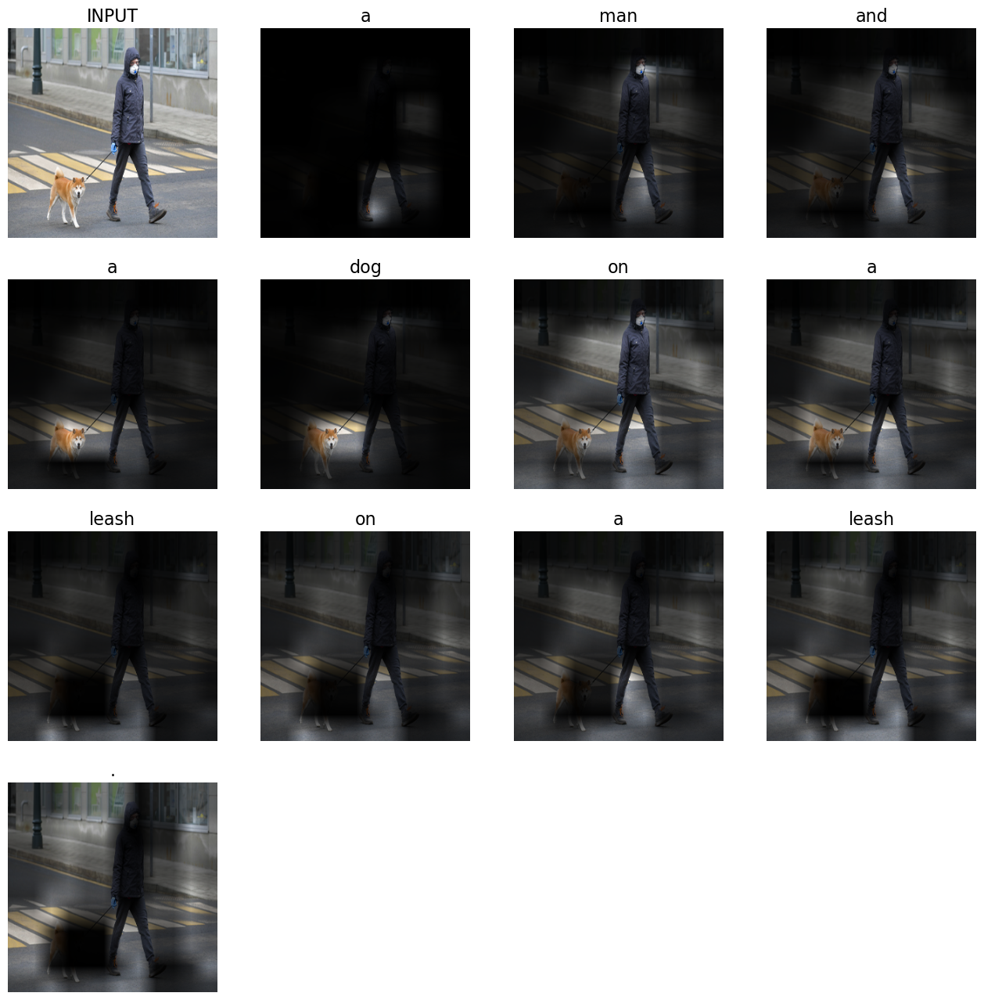

In [163]:
process_image(obtain_image(url="https://www.pnp.ru/upload/entities/2020/04/06/article/detailPicture/0a/1d/1a/50/b8ad784223136463edf731cd3cc2400d.jpg"))

a woman sitting on a couch with a dog in the background .
a woman is sitting on a couch with a dog .
a woman sitting on a couch with a dog on a chair .
a woman sitting on a couch with a dog .
a woman sitting on a couch with a dog on the floor .
a woman sitting on a chair with a chair .
a woman sitting on a chair with a dog on the floor .
a woman sitting on a chair in a chair .
a woman sitting on a chair using a cell phone .
a woman sitting on a chair with a dog in her hand .


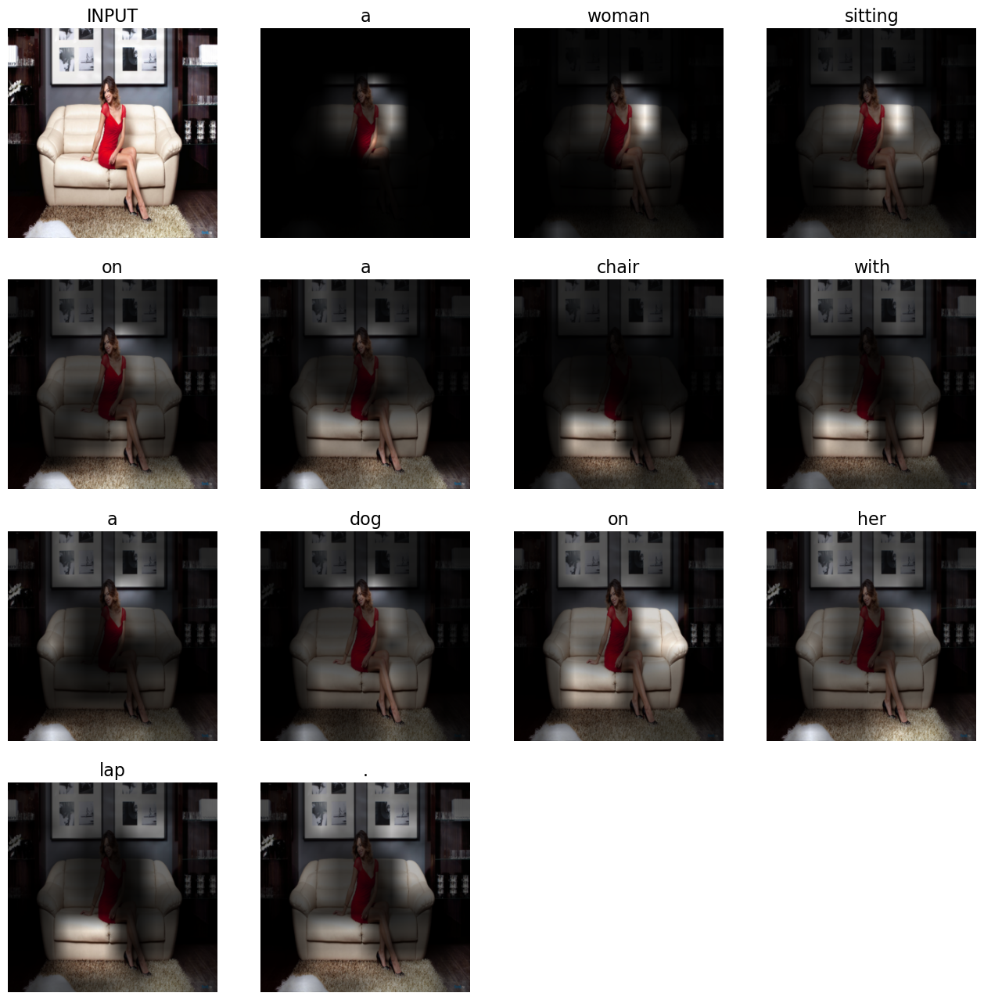

In [170]:
process_image(obtain_image(url="https://idei.club/uploads/posts/2022-02/1645748167_1-idei-club-p-zhenshchina-sidit-na-divane-interer-krasiv-1.jpg"))

a cat sitting on a chair with a chair .
a cat sitting on a chair with a basket on the back of it .
a cat sitting on a chair with a bicycle .
a cat sitting on top of a chair with a bicycle .
a cat sitting on a chair with a chair .
a cat sitting on a chair with a chair .
a cat sitting on a chair with a chair .
a cat sitting on a chair with a leash on the back of it .
a cat sitting on top of a wooden chair .
a cat sitting on a chair with a chair .


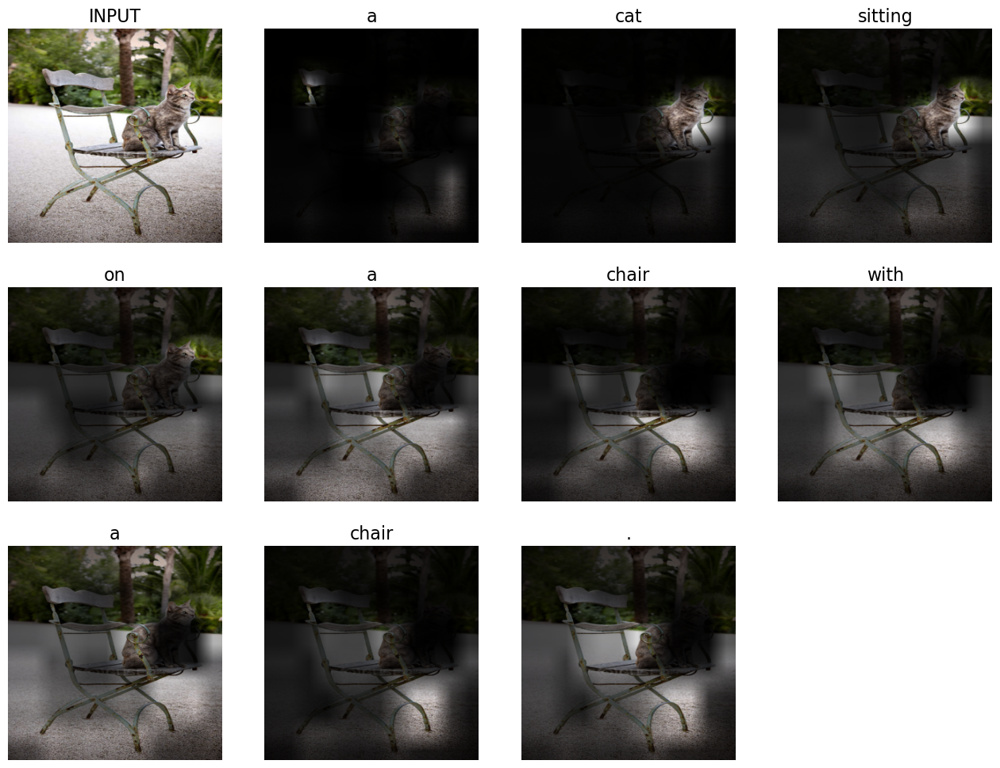

In [171]:
process_image(obtain_image(url="https://st.focusedcollection.com/14026668/i/650/focused_178098614-stock-photo-cat-sitting-garden-chair-looking.jpg"))

a car driving down a road with a car on it .
a car parked on a road with a car on the side .
a car driving down a road with a car on the side .
a car driving down a road with a car .
a car parked on the side of a road .
a car parked on a street in a parking lot .
a car driving down the road with a car on the side
a car driving down a road with a car
a car driving down a road with a red and white car .
a car driving down a road next to a car .


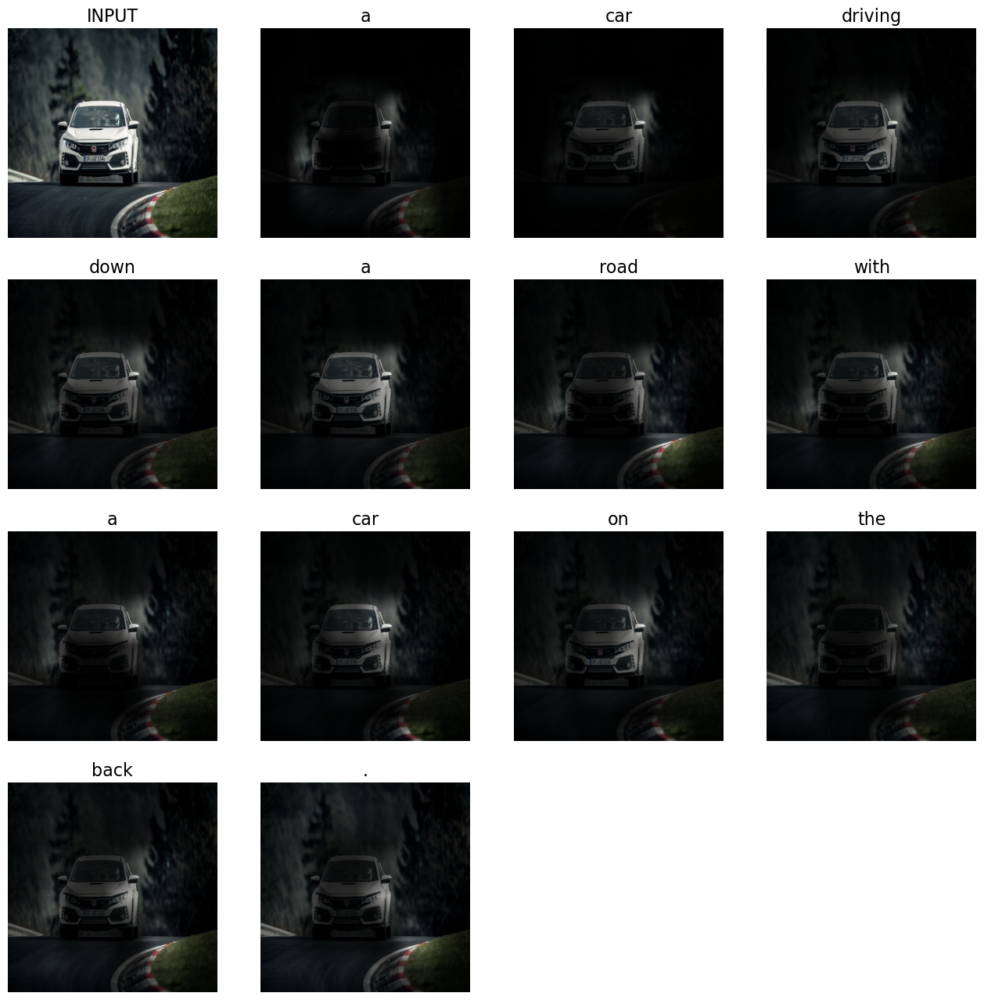

In [175]:
process_image(obtain_image(url="https://www.zrkuban.ru/pic/170403_CivicTypeR_TimeAttack%20_305_jpg-01.jpg"))

a red bus driving down a street next to a building .
a bus driving down a street next to a building .
a bus driving down a street next to a street .
a bus is parked on a street in front of a building .
a bus driving down a street next to a building .
a bus driving down a street next to a building .
a bus driving down a street with a large red bus .
a bus driving down a street next to a city street .
a bus driving down a street next to a city street .
a bus driving down a street in front of a building .


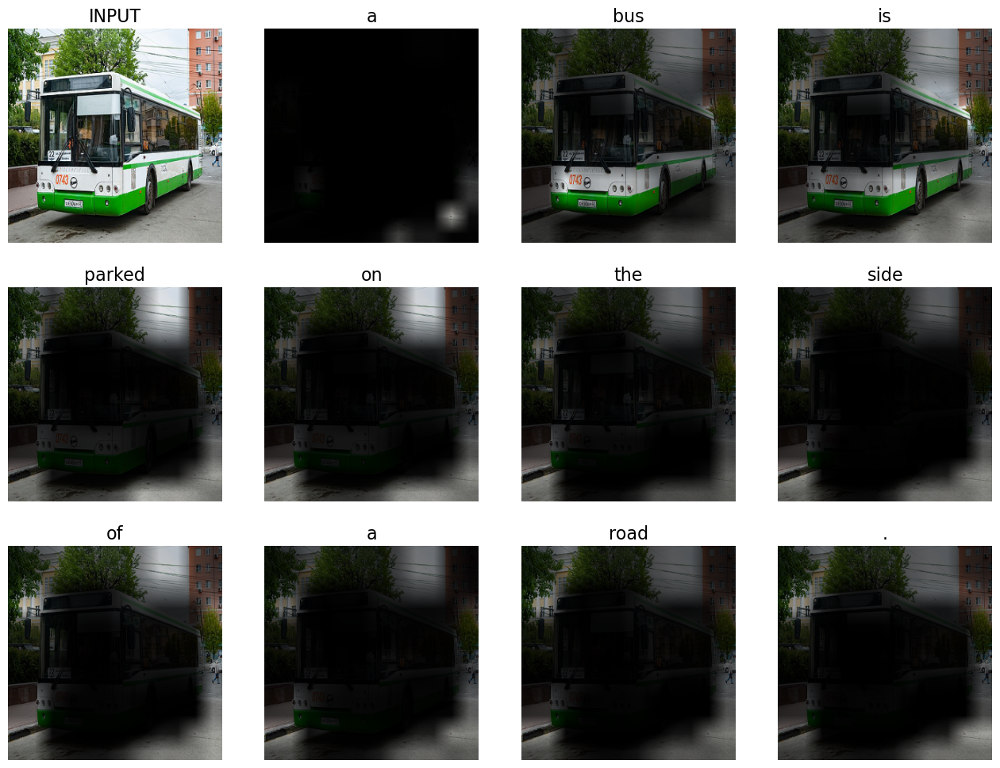

In [174]:
process_image(obtain_image(url="https://upload.wikimedia.org/wikipedia/commons/thumb/0/03/LiAZ-5292_Ryazan.jpg/548px-LiAZ-5292_Ryazan.jpg"))

a dog jumping in the air on a field .
a dog jumping in the air on a field
a dog jumping in the air on a field .
a dog jumping in the air on a field .
a dog jumping over a frisbee on a field .
a dog jumping in the air on a field
a dog jumping in the air on a field .
a dog running through a grassy field with a frisbee .
a dog jumping over a frisbee on a field .
a dog jumping over a frisbee on a field .


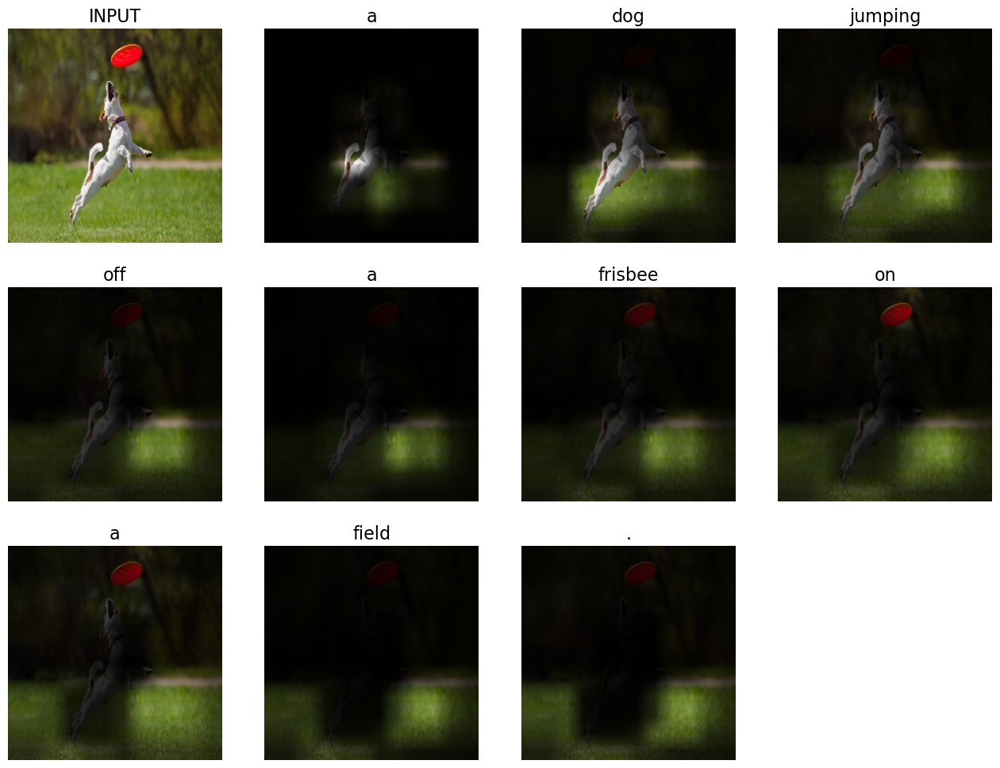

In [176]:
process_image(obtain_image(url="https://zoo-galereya.ru/img/work/article/a_548_706.JPG"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt).
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563